In [30]:
import numpy as np
import pandas as pd
import seaborn as sns
from datetime import date, datetime
from dateutil.relativedelta import relativedelta
import warnings
from matplotlib import pyplot as plt
warnings.filterwarnings('ignore')
import missingno as msno
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification
from sklearn.preprocessing import LabelEncoder
from sklearn.feature_selection import SelectFromModel
from sklearn.feature_selection import SelectPercentile
from sklearn.feature_selection import chi2 , f_classif
from sklearn.model_selection import train_test_split,ParameterGrid
from sklearn.linear_model import LogisticRegression
from sklearn.calibration import calibration_curve
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV
from tabulate import tabulate
from sklearn.preprocessing import StandardScaler
from tabulate import tabulate
from sklearn.metrics import confusion_matrix
from imblearn.over_sampling import SMOTE
import shap

In [31]:
df = pd.read_csv('breast-cancer.csv')

In [32]:
df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [33]:
df.shape

(569, 32)

In [34]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 32 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

In [35]:
df.describe()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,5.690000e+02,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,3.037183e+07,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,1.250206e+08,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,8.670000e+03,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,8.692180e+05,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,9.060240e+05,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,8.813129e+06,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,9.113205e+08,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


In [36]:
df = df.drop('id', axis=1, errors='ignore')

## Exploratory Data Analysis 

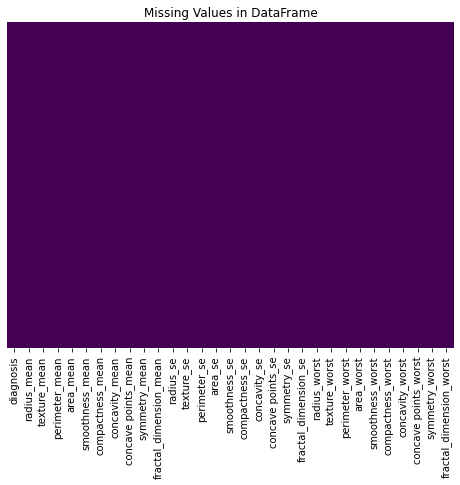

In [37]:
##Missing values 

plt.figure(figsize=(8, 6))
sns.heatmap(df.isnull(), cmap='viridis', cbar=False, yticklabels=False)
plt.title('Missing Values in DataFrame')
plt.show()

In [38]:
# Get numeric variables 
numeric_var = df.select_dtypes(include=['float64', 'int64'])
numeric_var.columns

Index(['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean',
       'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst'],
      dtype='object')

In [39]:
# Get categorical variables 
categorical_var = df.select_dtypes(include=['object'])
categorical_var.columns

Index(['diagnosis'], dtype='object')

In [40]:
## summary statistics for categorical variables 
categorical_var.describe()

,diagnosis
count,569
unique,2
top,B
freq,357


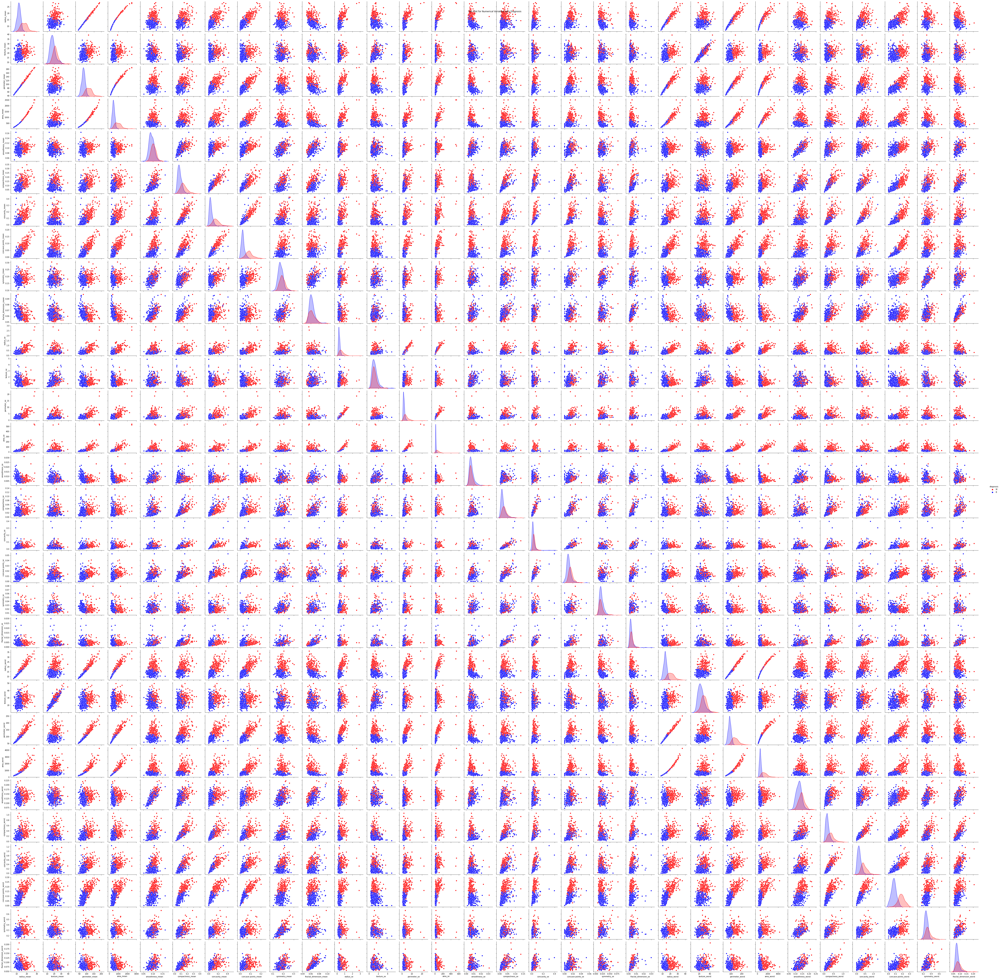

In [12]:
# Create a pair plot
sns.pairplot(df, hue='diagnosis', palette={'M': 'red', 'B': 'blue'})
plt.suptitle('Pair Plot for Numerical Variables with Diagnosis')
plt.show()

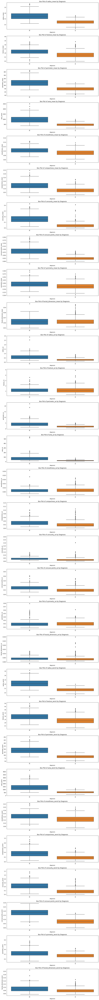

In [41]:
# Get the number of numerical variables
num_numerical_vars = len(df.columns) - 1  # Exclude the 'diagnosis' column

# Create box plots for numerical variables with the categorical variable 'diagnosis'
plt.figure(figsize=(12, 4 * num_numerical_vars))
for i, col in enumerate(df.columns[1:]):  # Exclude the 'diagnosis' column
    plt.subplot(num_numerical_vars, 1, i + 1)
    sns.boxplot(x='diagnosis', y=col, data=df)
    plt.title(f'Box Plot of {col} by Diagnosis')

plt.tight_layout()
plt.show()

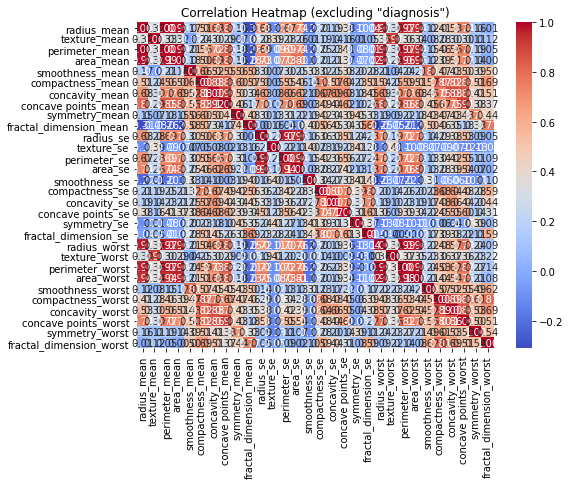

In [14]:
# Drop the 'diagnosis' column before calculating the correlation
numerical_df = df.drop('diagnosis', axis=1)

# Calculate the correlation matrix
correlation_matrix = numerical_df.corr()

# Create a heatmap for visualization
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap (excluding "diagnosis")')
plt.show()

In [42]:
# Drop the 'diagnosis' column before calculating the correlation
numerical_df = df.drop('diagnosis', axis=1)

# Calculate the correlation matrix
correlation_matrix = numerical_df.corr()

# Set a correlation threshold
correlation_threshold = 0.8

# Find pairs of highly correlated columns
highly_correlated_pairs = [(col1, col2) for col1 in correlation_matrix.columns
                           for col2 in correlation_matrix.columns
                           if col1 < col2 and abs(correlation_matrix.loc[col1, col2]) > correlation_threshold]

# Print highly correlated pairs
print("Highly Correlated Pairs:")
for pair in highly_correlated_pairs:
    print(pair)

# Drop one column from each highly correlated pair
for col1, col2 in highly_correlated_pairs:
    if col1 in df.columns and col2 in df.columns:
        df.drop(col2, axis=1, inplace=True)

# Display the DataFrame after dropping columns
print("\nDataFrame after dropping highly correlated columns:")
df

Highly Correlated Pairs:
('radius_mean', 'radius_worst')
('texture_mean', 'texture_worst')
('perimeter_mean', 'radius_mean')
('perimeter_mean', 'radius_worst')
('perimeter_mean', 'perimeter_worst')
('area_mean', 'radius_mean')
('area_mean', 'perimeter_mean')
('area_mean', 'concave points_mean')
('area_mean', 'area_se')
('area_mean', 'radius_worst')
('area_mean', 'perimeter_worst')
('area_mean', 'area_worst')
('smoothness_mean', 'smoothness_worst')
('compactness_mean', 'concavity_mean')
('compactness_mean', 'concave points_mean')
('compactness_mean', 'compactness_worst')
('compactness_mean', 'concavity_worst')
('compactness_mean', 'concave points_worst')
('concavity_mean', 'concavity_worst')
('concave points_mean', 'radius_mean')
('concave points_mean', 'perimeter_mean')
('concave points_mean', 'concavity_mean')
('concave points_mean', 'radius_worst')
('concave points_mean', 'perimeter_worst')
('concave points_mean', 'concave points_worst')
('perimeter_se', 'radius_se')
('area_se', 'rad

,diagnosis,texture_mean,area_mean,smoothness_mean,compactness_mean,symmetry_mean,fractal_dimension_mean,texture_se,perimeter_se,smoothness_se,compactness_se,concave points_se,symmetry_se,symmetry_worst,fractal_dimension_worst
0,M,10.38,1001.0,0.11840,0.27760,0.2419,0.07871,0.9053,8.589,0.006399,0.04904,0.01587,0.03003,0.4601,0.11890
1,M,17.77,1326.0,0.08474,0.07864,0.1812,0.05667,0.7339,3.398,0.005225,0.01308,0.01340,0.01389,0.2750,0.08902
2,M,21.25,1203.0,0.10960,0.15990,0.2069,0.05999,0.7869,4.585,0.006150,0.04006,0.02058,0.02250,0.3613,0.08758
3,M,20.38,386.1,0.14250,0.28390,0.2597,0.09744,1.1560,3.445,0.009110,0.07458,0.01867,0.05963,0.6638,0.17300
4,M,14.34,1297.0,0.10030,0.13280,0.1809,0.05883,0.7813,5.438,0.011490,0.02461,0.01885,0.01756,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,M,22.39,1479.0,0.11100,0.11590,0.1726,0.05623,1.2560,7.673,0.010300,0.02891,0.02454,0.01114,0.2060,0.07115
565,M,28.25,1261.0,0.09780,0.10340,0.1752,0.05533,2.4630,5.203,0.005769,0.02423,0.01678,0.01898,0.2572,0.06637
566,M,28.08,858.1,0.08455,0.10230,0.1590,0.05648,1.0750,3.425,0.005903,0.03731,0.01557,0.01318,0.2218,0.07820
567,M,29.33,1265.0,0.11780,0.27700,0.2397,0.07016,1.5950,5.772,0.006522,0.06158,0.01664,0.02324,0.4087,0.12400


### Feature Selection

In [43]:
# Convert categorical variables
df[categorical_var.columns] = df[categorical_var.columns].astype(str) 
df[categorical_var.columns] = df[categorical_var.columns].apply(LabelEncoder().fit_transform)

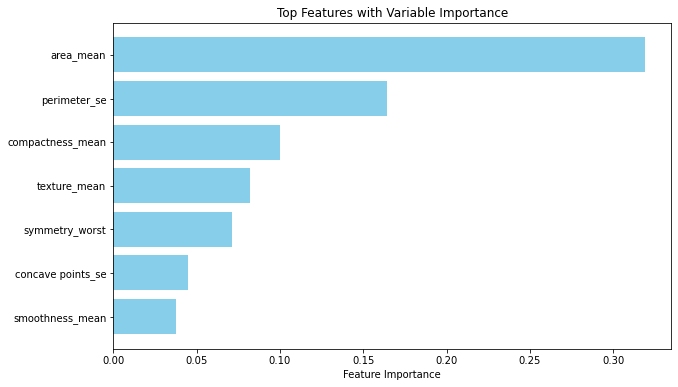

In [44]:
# Separate your dataset into X (features) and y (target variable)
X = df.drop('diagnosis', axis=1)  
y = df['diagnosis']

# Initialize the Random Forest classifier
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)

# Fit the model to your data
rf_classifier.fit(X, y)

# Get feature importances from the trained Random Forest model
feature_importances = rf_classifier.feature_importances_

# Sort features by importance in descending order
sorted_feature_indices = feature_importances.argsort()[::-1]

# Number of top features to select
num_top_features = 7

# Select the top N important features
selected_features = X.iloc[:, sorted_feature_indices[:num_top_features]]

# The top feature column names and their importances
top_feature_names = X.columns[sorted_feature_indices[:num_top_features]]
top_feature_importances = feature_importances[sorted_feature_indices[:num_top_features]]

# Create a bar plot
plt.figure(figsize=(10, 6))
plt.barh(top_feature_names, top_feature_importances, color='skyblue')
plt.xlabel('Feature Importance')
plt.title('Top Features with Variable Importance')
plt.gca().invert_yaxis()  
plt.show()

### Model Implemenation and Evaluation 

In [45]:
#creating a df with the selected fetaures 
selected_data = df[top_feature_names.tolist() + ['diagnosis']]

In [46]:
selected_data.head()

,area_mean,perimeter_se,compactness_mean,texture_mean,symmetry_worst,concave points_se,smoothness_mean,diagnosis
0,1001.0,8.589,0.27760,10.38,0.4601,0.01587,0.11840,1
1,1326.0,3.398,0.07864,17.77,0.2750,0.01340,0.08474,1
2,1203.0,4.585,0.15990,21.25,0.3613,0.02058,0.10960,1
3,386.1,3.445,0.28390,20.38,0.6638,0.01867,0.14250,1
4,1297.0,5.438,0.13280,14.34,0.2364,0.01885,0.10030,1


In [47]:
##splitting the dataset 

# Define the features and target variable
X = selected_data.drop('diagnosis', axis=1)
y = selected_data['diagnosis']

# Split the data into training, testing, and validation sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, random_state=42, shuffle=True)
X_test, X_val, y_test, y_val = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42, shuffle=True)

In [21]:
#from sklearn.preprocessing import StandardScaler 
#sc = StandardScaler() 

#X_train = sc.fit_transform(X_train) 
#X_test = sc.transform(X_test)

#### Model 1 : Logistic Regression 

Validation Set Results:
Accuracy: 0.9122807017543859
Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.95      0.94        76
           1       0.89      0.84      0.86        38

    accuracy                           0.91       114
   macro avg       0.91      0.89      0.90       114
weighted avg       0.91      0.91      0.91       114

ROC AUC (Validation): 0.98
PR AUC (Validation): 0.96
Test Set Results:
Accuracy: 0.9385964912280702
Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.96      0.95        72
           1       0.93      0.90      0.92        42

    accuracy                           0.94       114
   macro avg       0.94      0.93      0.93       114
weighted avg       0.94      0.94      0.94       114

ROC AUC (Test): 0.99
PR AUC (Test): 0.98


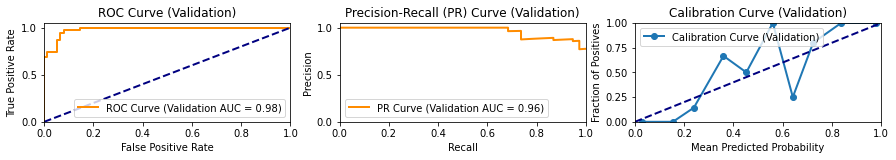

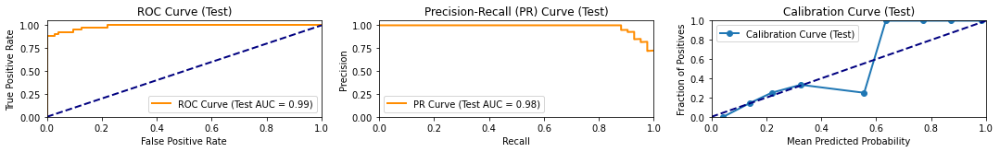

In [48]:
from sklearn.metrics import accuracy_score, classification_report, roc_auc_score, auc, roc_curve 
from sklearn.metrics import precision_recall_curve

# Initialize the logistic regression model
logistic_regression = LogisticRegression()

# Fit the model on the training data
logistic_regression.fit(X_train, y_train)

# Create evaluation functions
def evaluate(model, X, y, label):
    y_pred = model.predict(X)
    y_prob = model.predict_proba(X)[:, 1]
    
    accuracy = accuracy_score(y, y_pred)
    classification = classification_report(y, y_pred)
    
    fpr, tpr, _ = roc_curve(y, y_prob)
    roc_auc = auc(fpr, tpr)
    
    precision, recall, _ = precision_recall_curve(y, y_prob)
    pr_auc = auc(recall, precision)
    
    prob_true, prob_pred = calibration_curve(y, y_prob, n_bins=10, strategy='uniform')
    
    print(f"{label} Set Results:")
    print(f"Accuracy: {accuracy}")
    print("Classification Report:")
    print(classification)
    print(f"ROC AUC ({label}): {roc_auc:.2f}")
    print(f"PR AUC ({label}): {pr_auc:.2f}")
    
    # Create the ROC Curve plot
    plt.figure(figsize=(15, 4))
    plt.subplot(2, 3, 1)
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC Curve ({label} AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve ({label})')
    plt.legend(loc='lower right')

    # Create the Precision-Recall Curve plot
    plt.subplot(2, 3, 2)
    plt.plot(recall, precision, color='darkorange', lw=2, label=f'PR Curve ({label} AUC = {pr_auc:.2f})')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title(f'Precision-Recall (PR) Curve ({label})')
    plt.legend(loc='lower left')

    # Create the Calibration Curve plot
    plt.subplot(2, 3, 3)
    plt.plot(prob_pred, prob_true, marker='o', lw=2, label=f'Calibration Curve ({label})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.0])
    plt.xlabel('Mean Predicted Probability')
    plt.ylabel('Fraction of Positives')
    plt.title(f'Calibration Curve ({label})')
    plt.legend(loc='upper left')

# Evaluate on the validation set
evaluate(logistic_regression, X_val, y_val, 'Validation')

# Evaluate on the test set
evaluate(logistic_regression, X_test, y_test, 'Test')

# Show the plots
plt.tight_layout()
plt.show()

#### Model 2 : Random Forest 

Validation Set Results:
Accuracy: 0.9385964912280702
Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.93      0.95        76
           1       0.88      0.95      0.91        38

    accuracy                           0.94       114
   macro avg       0.93      0.94      0.93       114
weighted avg       0.94      0.94      0.94       114

ROC AUC (Validation): 0.99
PR AUC (Validation): 0.99
Test Set Results:
Accuracy: 0.956140350877193
Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.96      0.97        72
           1       0.93      0.95      0.94        42

    accuracy                           0.96       114
   macro avg       0.95      0.96      0.95       114
weighted avg       0.96      0.96      0.96       114

ROC AUC (Test): 0.99
PR AUC (Test): 0.98


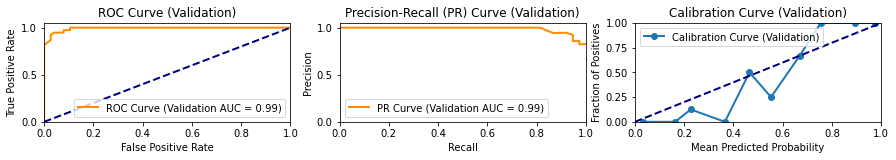

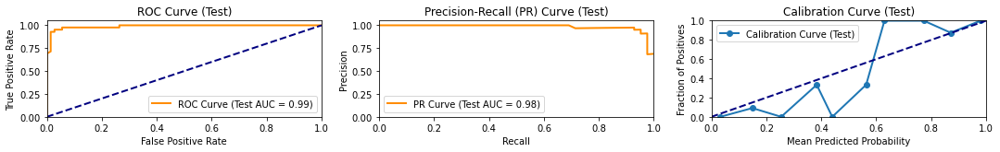

In [49]:
# Initialize the Random Forest classifier
random_forest = RandomForestClassifier(n_estimators=100, random_state=42)

# Fit the model on the training data
random_forest.fit(X_train, y_train)

# Create evaluation functions
def evaluate(model, X, y, label):
    y_pred = model.predict(X)
    y_prob = model.predict_proba(X)[:, 1]
    
    accuracy = accuracy_score(y, y_pred)
    classification = classification_report(y, y_pred)
    
    fpr, tpr, _ = roc_curve(y, y_prob)
    roc_auc = auc(fpr, tpr)
    
    precision, recall, _ = precision_recall_curve(y, y_prob)
    pr_auc = auc(recall, precision)
    
    prob_true, prob_pred = calibration_curve(y, y_prob, n_bins=10, strategy='uniform')
    
    print(f"{label} Set Results:")
    print(f"Accuracy: {accuracy}")
    print("Classification Report:")
    print(classification)
    print(f"ROC AUC ({label}): {roc_auc:.2f}")
    print(f"PR AUC ({label}): {pr_auc:.2f}")
    
    # Create the ROC Curve plot
    plt.figure(figsize=(15, 4))
    plt.subplot(2, 3, 1)
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC Curve ({label} AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve ({label})')
    plt.legend(loc='lower right')

    # Create the Precision-Recall Curve plot
    plt.subplot(2, 3, 2)
    plt.plot(recall, precision, color='darkorange', lw=2, label=f'PR Curve ({label} AUC = {pr_auc:.2f})')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title(f'Precision-Recall (PR) Curve ({label})')
    plt.legend(loc='lower left')

    # Create the Calibration Curve plot
    plt.subplot(2, 3, 3)
    plt.plot(prob_pred, prob_true, marker='o', lw=2, label=f'Calibration Curve ({label})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.0])
    plt.xlabel('Mean Predicted Probability')
    plt.ylabel('Fraction of Positives')
    plt.title(f'Calibration Curve ({label})')
    plt.legend(loc='upper left')

# Evaluate on the validation set
evaluate(random_forest, X_val, y_val, 'Validation')

# Evaluate on the test set
evaluate(random_forest, X_test, y_test, 'Test')

# Show the plots
plt.tight_layout()
plt.show()

In [50]:
# Define the parameter grid to search
param_grid = {
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 4, 5],
    'n_estimators': [100, 200, 300],
}

# Create an XGBoost classifier
xgb = XGBClassifier()

# Perform Grid Search with cross-validation
grid_search = GridSearchCV(xgb, param_grid, scoring='accuracy', cv=5)
grid_search.fit(X_train, y_train)

# Get the best hyperparameters
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

Best Hyperparameters: {'learning_rate': 0.01, 'max_depth': 4, 'n_estimators': 300}


Validation Set Results:
Accuracy: 0.9649122807017544
Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.95      0.97        76
           1       0.90      1.00      0.95        38

    accuracy                           0.96       114
   macro avg       0.95      0.97      0.96       114
weighted avg       0.97      0.96      0.97       114

ROC AUC (Validation): 1.00
PR AUC (Validation): 1.00
Test Set Results:
Accuracy: 0.956140350877193
Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.96      0.97        72
           1       0.93      0.95      0.94        42

    accuracy                           0.96       114
   macro avg       0.95      0.96      0.95       114
weighted avg       0.96      0.96      0.96       114

ROC AUC (Test): 0.98
PR AUC (Test): 0.98


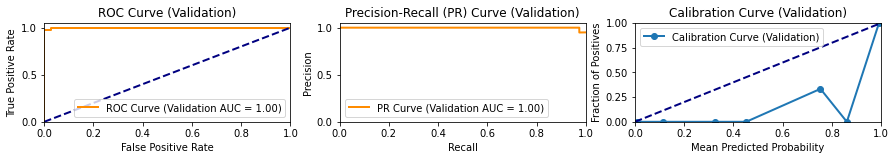

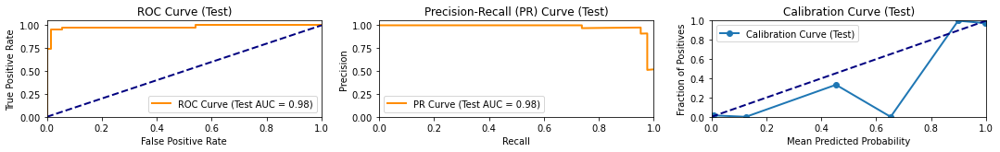

In [51]:
# Initialize the XGBoost classifier
xgb_classifier = XGBClassifier(learning_rate=0.1, max_depth=4, n_estimators=300)

# Fit the model on the training data
xgb_classifier.fit(X_train, y_train)

# Create evaluation functions
def evaluate(model, X, y, label):
    y_pred = model.predict(X)
    y_prob = model.predict_proba(X)[:, 1]
    
    accuracy = accuracy_score(y, y_pred)
    classification = classification_report(y, y_pred)
    
    fpr, tpr, _ = roc_curve(y, y_prob)
    roc_auc = auc(fpr, tpr)
    
    precision, recall, _ = precision_recall_curve(y, y_prob)
    pr_auc = auc(recall, precision)
    
    prob_true, prob_pred = calibration_curve(y, y_prob, n_bins=10, strategy='uniform')
    
    print(f"{label} Set Results:")
    print(f"Accuracy: {accuracy}")
    print("Classification Report:")
    print(classification)
    print(f"ROC AUC ({label}): {roc_auc:.2f}")
    print(f"PR AUC ({label}): {pr_auc:.2f}")
    
    # Create the ROC Curve plot
    plt.figure(figsize=(15, 4))
    plt.subplot(2, 3, 1)
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC Curve ({label} AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve ({label})')
    plt.legend(loc='lower right')

    # Create the Precision-Recall Curve plot
    plt.subplot(2, 3, 2)
    plt.plot(recall, precision, color='darkorange', lw=2, label=f'PR Curve ({label} AUC = {pr_auc:.2f})')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title(f'Precision-Recall (PR) Curve ({label})')
    plt.legend(loc='lower left')

    # Create the Calibration Curve plot
    plt.subplot(2, 3, 3)
    plt.plot(prob_pred, prob_true, marker='o', lw=2, label=f'Calibration Curve ({label})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.0])
    plt.xlabel('Mean Predicted Probability')
    plt.ylabel('Fraction of Positives')
    plt.title(f'Calibration Curve ({label})')
    plt.legend(loc='upper left')

# Evaluate on the validation set
evaluate(xgb_classifier, X_val, y_val, 'Validation')

# Evaluate on the test set
evaluate(xgb_classifier, X_test, y_test, 'Test')

# Show the plots
plt.tight_layout()
plt.show()

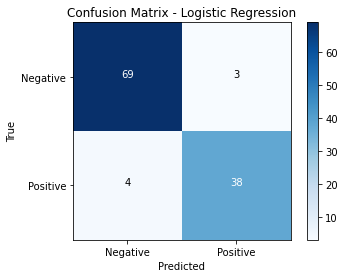

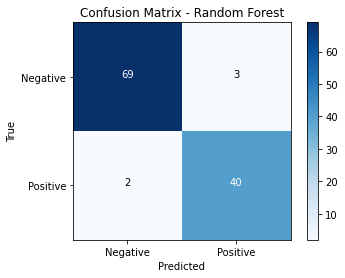

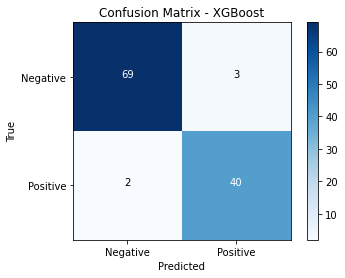

    Model                  TP    FN    TN    FP    Sensitivity    Specificity    AUC
--  -------------------  ----  ----  ----  ----  -------------  -------------  -----
 0  Logistic Regression    38     4    69     3           0.9            0.96   0.99
 1  Random Forest          40     2    69     3           0.95           0.96   0.99
 2  XGBoost                40     2    69     3           0.95           0.96   0.98


In [52]:
# Define a function to plot confusion matrix
def plot_confusion_matrix(y_true, y_pred, model_name):
    cm = confusion_matrix(y_true, y_pred)
    plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title(f'Confusion Matrix - {model_name}')
    plt.colorbar()
    tick_marks = [0, 1]
    plt.xticks(tick_marks, ["Negative", "Positive"])
    plt.yticks(tick_marks, ["Negative", "Positive"])
    plt.xlabel('Predicted')
    plt.ylabel('True')

    for i in range(2):
        for j in range(2):
            plt.text(j, i, str(cm[i, j]), horizontalalignment="center", color="white" if cm[i, j] > cm.max() / 2 else "black")

    plt.show()

# Initialize lists to store performance metrics
metrics = []

# Models you want to evaluate
model_names = ["Logistic Regression", "Random Forest", "XGBoost"]

# Iterate through the models and calculate metrics
for model_name, model in zip(model_names, [logistic_regression, random_forest, xgb_classifier]):
    y_test_prob = model.predict_proba(X_test)[:, 1]
    y_pred = (y_test_prob > 0.5).astype(int)
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)

    fpr, tpr, _ = roc_curve(y_test, y_test_prob)
    auc_score = auc(fpr, tpr)

    metrics.append({
        "Model": model_name,
        "TP": tp,
        "FN": fn,
        "TN": tn,
        "FP": fp,
        "Sensitivity": f"{sensitivity:.2f}",
        "Specificity": f"{specificity:.2f}",
        "AUC": f"{auc_score:.2f}"
    })

    # Plot confusion matrix
    plot_confusion_matrix(y_test, y_pred, model_name)

# Create a DataFrame with the metrics
results_df = pd.DataFrame(metrics)

# Format the DataFrame to round values to two decimal places
results_df = results_df.round(2)

# Print the results as a table
print(tabulate(results_df, headers='keys', tablefmt='prettyfied'))

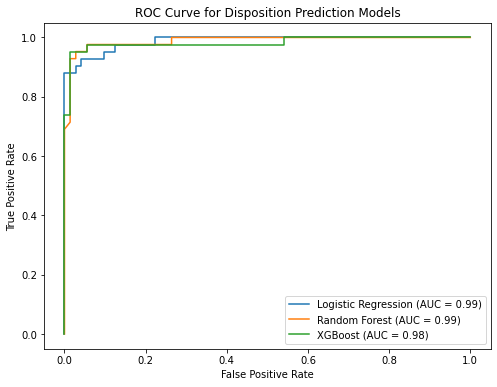

In [53]:
# Define model names and models
model_names = ["Logistic Regression", "Random Forest", "XGBoost"]
models = [logistic_regression, random_forest, xgb_classifier]

# Initialize a figure
plt.figure(figsize=(8, 6))

# Plot ROC curves for each model
for model_name, model in zip(model_names, models):
    y_test_prob = model.predict_proba(X_test)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_test_prob)
    auc = roc_auc_score(y_test, y_test_prob)
    plt.plot(fpr, tpr, label=f'{model_name} (AUC = {auc:.2f})')

# Set labels and title
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Disposition Prediction Models')

# Add a legend
plt.legend(loc='lower right')

# Show the plot
plt.show()